# **Install and Import Requierd Library**

In [1]:
!pip install lime

In [2]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
import pandas as pd
import regex as re
from nltk.tokenize import word_tokenize
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from gensim.models import Word2Vec
import numpy as np
from imblearn.over_sampling import SMOTE
import lime
import lime.lime_text
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

**Load the dataset**

In [4]:
df = pd.read_excel('/kaggle/input/dataset-for-sentiment/dataset (1).xlsx')

In [5]:
df.head()

,Text,Sentiment
0,আপনারা নিতে পারেন ভালো কাজ করে আমি ব্যাবহার কর...,1.0
1,এক কথায় অসাধারণ একটা জিনিস। আগে অনেক রিমুভার ...,1.0
2,অনেক ভালো লাগছে ❤️ যেমন টা চেয়েছি তেমনটাই পেলা...,1.0
3,অনেক ভালো কাজ করে!,1.0
4,তবে যদি দাম টা আর একটু কম হতো তো মনে হয় আরো ভা...,0.0


In [6]:
print("Show Null Value in Dataset")
print("--------------------------")
df.isnull().sum()

Show Null Value in Dataset
--------------------------


Text         15
Sentiment    20
dtype: int64

In [7]:
print("Show Duplicate Value in Dataset")
print("--------------------------")
df.duplicated().sum()

Show Duplicate Value in Dataset
--------------------------


201

In [8]:
def dataPreprocessing(df):
  #1. Remove null value
  df.dropna(inplace=True,subset=['Text'])
  print("Null Value Remove Successfully....")

  #2. Remove Duplicate value
  df.drop_duplicates(inplace=True)
  print("Duplicate Value Remove Successfully....")

  #3. Remove Non-Character Word(like emoji)
  df['Text'] = df['Text'].apply(lambda x: re.sub(r'[^\u0980-\u09FF\s]+', '', x))
  print("Non-Character Word Remove Successfully....")

  #4. Remove Non Bengali Character
  bengali_pattern = re.compile("[\u0980-\u09FF ]+")
  df['Bengali_Text'] = df['Text'].apply(lambda x: "".join(filter(bengali_pattern.match, x)))
  print("Non bengali Character Remove Successfully....")

  #5. Removing stopwords
  def process_conversations(Conversation):
    stp = open('/kaggle/input/dataset-for-sentiment/bangla_stopwords (1).txt','r',encoding="utf8").read().split()
    result = Conversation.split()
    Conversation = [word.strip() for word in result if word not in stp ]
    Conversation =" ".join(Conversation)
    Conversation = re.sub('[^\u0980-\u09FF]',' ',str(Conversation))
    return Conversation
  df['cleaned'] = df['Bengali_Text'].apply(process_conversations)
  print("Stopwords Remove Successfully....")

  #remove the small Sentence
  df['no_char'] = df['cleaned'].apply(lambda Sentence: len(Sentence))
  df['length'] = df['cleaned'].apply(lambda x:len(x.split()))
  df = df.sort_values(by='length', ascending=False)
  dataset = df.loc[df.length>2]
  dataset = dataset.reset_index(drop = True)
  print("After Cleaning:","\nRemoved {} Small conversations".format(len(df)-len(dataset)),
      "\nTotal conversations:",len(dataset))

  #Remove Big Sentence
  df = dataset.loc[dataset['length'] <= 200]
  df = df.reset_index(drop = True)
  print("After Cleaning:","\nRemoved {} Big conversations".format(len(dataset)-len(df)),
      "\nTotal conversations:",len(df))

In [9]:
dataPreprocessing(df)

Null Value Remove Successfully....
Duplicate Value Remove Successfully....
Non-Character Word Remove Successfully....
Non bengali Character Remove Successfully....
Stopwords Remove Successfully....
After Cleaning: 
Removed 469 Small conversations 
Total conversations: 4216
After Cleaning: 
Removed 0 Big conversations 
Total conversations: 4216


In [10]:
df.dropna(subset=['Sentiment'], inplace=True)

In [11]:
print("Show Null Value in Dataset After Data Preprocessing")
print("---------------------------------------------------")
df.isnull().sum()

Show Null Value in Dataset After Data Preprocessing
---------------------------------------------------


Text            0
Sentiment       0
Bengali_Text    0
cleaned         0
no_char         0
length          0
dtype: int64

In [12]:
df.drop_duplicates(inplace=True)

In [13]:
print("Show Duplicate Value in Dataset After Data Preprocessing")
print("--------------------------------------------------------")
df.duplicated().sum()

Show Duplicate Value in Dataset After Data Preprocessing
--------------------------------------------------------


0

In [14]:
df.sample(5)

,Text,Sentiment,Bengali_Text,cleaned,no_char,length
2948,যেমন সুন্দর দেখায় তেমন সুন্দর পাই নাই,0.0,যেমন সুন্দর দেখায় তেমন সুন্দর পাই নাই,সুন্দর দেখায় সুন্দর পাই,24,4
548,ডেলিভারি খুব তাড়াতাড়ি দিয়েছে ভাইয়ার ব্যবহ...,1.0,ডেলিভারি খুব তাড়াতাড়ি দিয়েছে ভাইয়ার ব্যবহ...,ডেলিভারি তাড়াতাড়ি ভাইয়ার ব্যবহারও ভালো প্যা...,216,34
895,আলহামদুলিল্লাহ্ ভালো পেয়াজ পেয়েছি একটিও পচা ছি...,1.0,আলহামদুলিল্লাহ্ ভালো পেয়াজ পেয়েছি একটিও পচা ছি...,আলহামদুলিল্লাহ্ ভালো পেয়াজ পেয়েছি একটিও পচা ধন...,117,18
2357,আলহামদুলিল্লাহ ডেলিভারি তারা তারি পেয়েছি,1.0,আলহামদুলিল্লাহ ডেলিভারি তারা তারি পেয়েছি,আলহামদুলিল্লাহ ডেলিভারি তারি পেয়েছি,35,4
130,অনেক ভালো এবং তাড়াতাড়ি ডেলিভারি ও পেলাম,1.0,অনেক ভালো এবং তাড়াতাড়ি ডেলিভারি ও পেলাম,ভালো তাড়াতাড়ি ডেলিভারি পেলাম,30,4


In [15]:
df.drop(["Text", "Bengali_Text", "no_char", "length"], axis=1, inplace=True)
df.dropna(subset=['Sentiment'], inplace=True)

In [16]:
df.sample(5)

,Sentiment,cleaned
289,1.0,ভালো লাগছে তারাতাড়ি চার্জ আপনারা নিলে
4002,1.0,তিন সপ্তাহে ওষুধ দিয়ে ১ টা মারতে পারছি চিপায় ম...
983,0.0,প্যাকেট ওজন ৫০০ গ্রাম আদার নমুনা এরকম নিলাম আদ...
2914,1.0,২টা অর্ডার করেছিলাম আলহামদুলিল্লাহ ভালো পেয়েছি...
376,0.0,মোবাইল লম্বালম্বি সেট একপাশে একটু কাত হয়ে হয়তো...


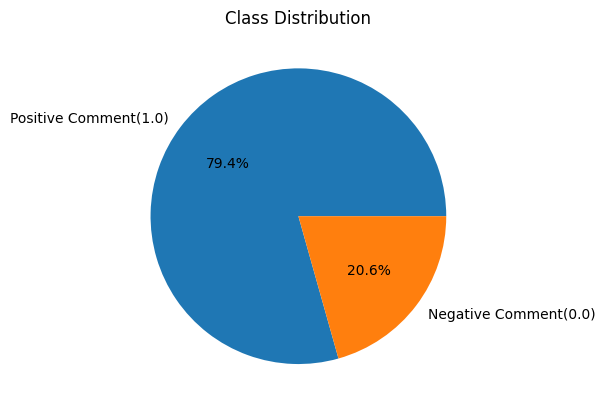

In [17]:
import matplotlib.pyplot as plt
class_counts = df['Sentiment'].value_counts()
class_percents = class_counts / class_counts.sum() * 100
# Plot the pie chart
plt.pie(class_percents, labels=['Positive Comment(1.0)', "Negative Comment(0.0)"], autopct='%1.1f%%')
plt.title('Class Distribution')
plt.show()

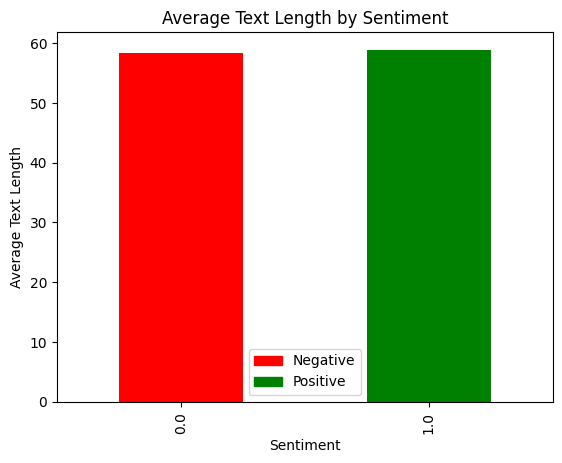

In [18]:
df['length'] = df['cleaned'].apply(len)

# Group by sentiment and calculate mean length
df.groupby('Sentiment')['length'].mean().plot(kind='bar', color=['red', 'green'])

# Plot the bar chart

plt.title('Average Text Length by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Average Text Length')

# Add legend
# Create a list of labels for the legend
labels = ['Negative', 'Positive']

# Create a list of handles (empty rectangles) for the legend
handles = [plt.Rectangle((0,0),1,1, color=color) for color in ['red', 'green']]

# Add the legend to the plot
plt.legend(handles, labels)

plt.show()

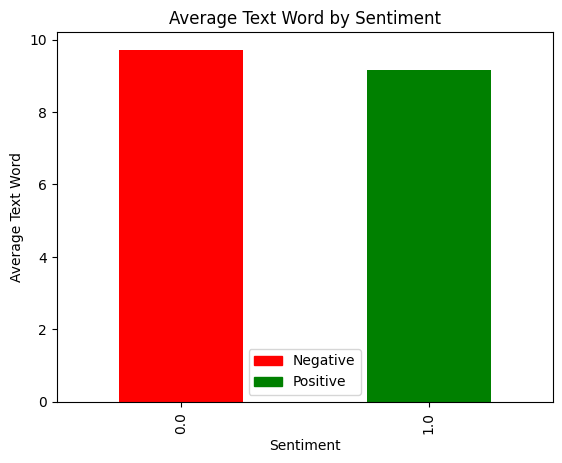

In [19]:
# prompt: Average Text Word by Sentiment

import matplotlib.pyplot as plt
df['word_count'] = df['cleaned'].apply(lambda x: len(str(x).split()))

# Group by sentiment and calculate mean word count
df.groupby('Sentiment')['word_count'].mean().plot(kind='bar', color=['red', 'green'])

# Plot the bar chart

plt.title('Average Text Word by Sentiment')
plt.xlabel('Sentiment')
plt.ylabel('Average Text Word')

# Add legend
# Create a list of labels for the legend
labels = ['Negative', 'Positive']

# Create a list of handles (empty rectangles) for the legend
handles = [plt.Rectangle((0,0),1,1, color=color) for color in ['red', 'green']]

# Add the legend to the plot
plt.legend(handles, labels)

plt.show()


In [20]:
from collections import Counter

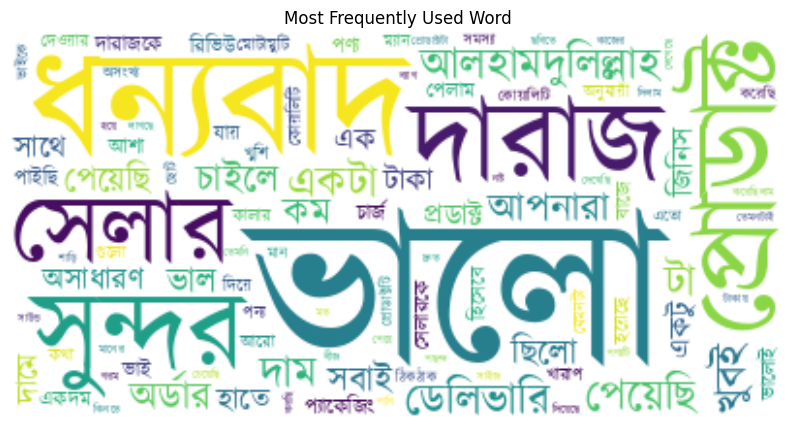

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you have a dataframe named df with a column named 'text' containing the text data
# Replace 'text' with the actual column name containing your text data

# Concatenate all text data into a single string
text = ' '.join(df['cleaned'])
words = text.split()
word_counts = Counter(words)
top_words = word_counts.most_common(100)
word_freq_dict = {word: freq for word, freq in top_words}
# Create a word cloud object
wordcloud = WordCloud(font_path='/kaggle/input/font-family/kalpurush.ttf', colormap='viridis',background_color="white").generate_from_frequencies(word_freq_dict)


# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequently Used Word')
plt.axis('off')
plt.show()

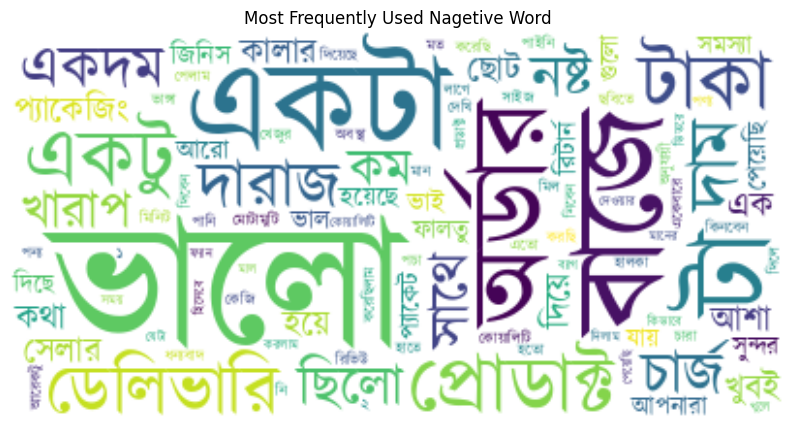

In [22]:
filtered_df = df[df['Sentiment'] == 0]
text = ' '.join(filtered_df['cleaned'])
words = text.split()
word_counts = Counter(words)
top_words = word_counts.most_common(100)
word_freq_dict = {word: freq for word, freq in top_words}
wordcloud = WordCloud(font_path='/kaggle/input/font-family/kalpurush.ttf', colormap='viridis',background_color="white").generate_from_frequencies(word_freq_dict)


# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Frequently Used Nagetive Word')
plt.show()

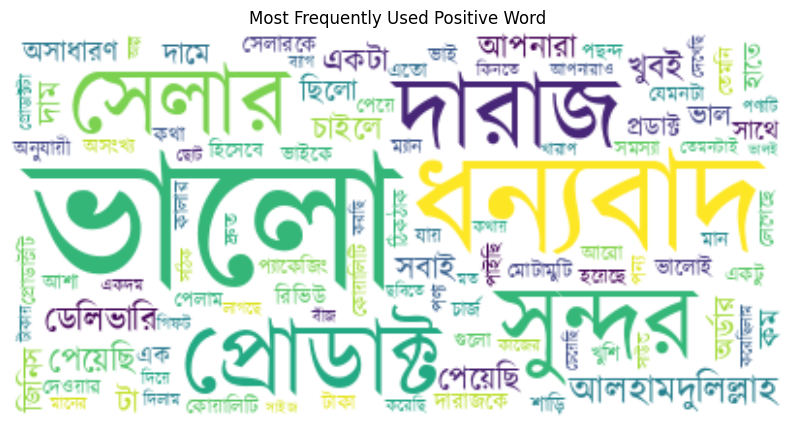

In [23]:
filtered_df = df[df['Sentiment'] == 1]
text = ' '.join(filtered_df['cleaned'])
words = text.split()
word_counts = Counter(words)
top_words = word_counts.most_common(100)
word_freq_dict = {word: freq for word, freq in top_words}
wordcloud = WordCloud(font_path='/kaggle/input/font-family/kalpurush.ttf', colormap='viridis',background_color="white").generate_from_frequencies(word_freq_dict)


# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Frequently Used Positive Word')
plt.show()

In [24]:
# Train Word2Vec model
processed_corpus = [word_tokenize(sentence) for sentence in df.cleaned]
model = Word2Vec(sentences=processed_corpus, vector_size=100, window=5, min_count=1, workers=4)
model.save("bangla_word2vec.model")
model = Word2Vec.load("bangla_word2vec.model")

In [25]:
# Function to compute the average vector of a document
def get_document_vector(document, model):
    valid_words = [word for word in document if word in model.wv]
    if not valid_words:
        return np.zeros(model.vector_size)
    return np.mean([model.wv[word] for word in valid_words], axis=0)

# Function to compute combined TF-IDF and Word2Vec embeddings
def get_combined_vector(document, tfidf_model, w2v_model):
    words = word_tokenize(document)
    tfidf_vector = tfidf_model.transform([document]).toarray().flatten()
    w2v_vector = get_document_vector(words, w2v_model)
    combined_vector = np.concatenate([tfidf_vector, w2v_vector])
    return combined_vector

# Train TF-IDF model
tfidf_vectorizer = TfidfVectorizer()
tfidf_vectorizer.fit(df.cleaned)
X_combined = [get_combined_vector(sentence, tfidf_vectorizer, model) for sentence in df.cleaned]

In [26]:
y = df['Sentiment']
smote = SMOTE()
X_smote_combined, y_smote_combined = smote.fit_resample(X_combined, y)

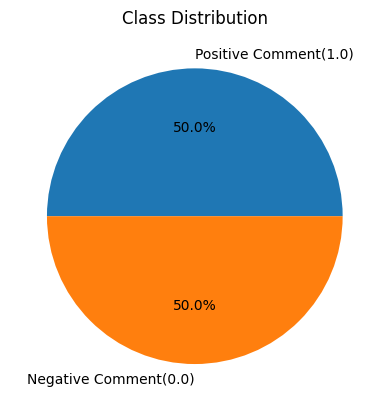

In [27]:
import matplotlib.pyplot as plt
class_counts = y_smote_combined.value_counts()
class_percents = class_counts / class_counts.sum() * 100
# Plot the pie chart
plt.pie(class_percents, labels=['Positive Comment(1.0)', "Negative Comment(0.0)"], autopct='%1.1f%%')
plt.title('Class Distribution')
plt.show()

In [28]:
X_train, X_temp, y_train, y_temp = train_test_split(X_smote_combined, y_smote_combined, test_size=0.3, random_state=42, stratify=y_smote_combined)
X_val, X_test, y_val, y_test= train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

In [29]:
class CombinedVectorizer:
    def __init__(self, tfidf_model, w2v_model):
        self.tfidf_model = tfidf_model
        self.w2v_model = w2v_model

    def transform(self, documents):
        return np.array([get_combined_vector(doc, self.tfidf_model, self.w2v_model) for doc in documents])

vectorizer = CombinedVectorizer(tfidf_vectorizer, model)


explainer = lime.lime_text.LimeTextExplainer(class_names=['Negative', 'Positive'])

# LR

In [30]:
logistic_reg = LogisticRegression(max_iter=1000)
logistic_reg.fit(X_train, y_train)
train_accuracy = accuracy_score(y_train, logistic_reg.predict(X_train))
val_accuracy = accuracy_score(y_val, logistic_reg.predict(X_val))
test_accuracy = accuracy_score(y_test, logistic_reg.predict(X_test))

print("Training Accuracy:", train_accuracy)
print("Validation Accuracy:", val_accuracy)
print("Test Accuracy:", test_accuracy)

Training Accuracy: 0.8551429126968695
Validation Accuracy: 0.8339382940108893
Test Accuracy: 0.8322756119673618


In [31]:
print("Classification Report:")
print(classification_report(y_test, logistic_reg.predict(X_test)))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84       552
         1.0       0.87      0.78      0.82       551

    accuracy                           0.83      1103
   macro avg       0.84      0.83      0.83      1103
weighted avg       0.84      0.83      0.83      1103



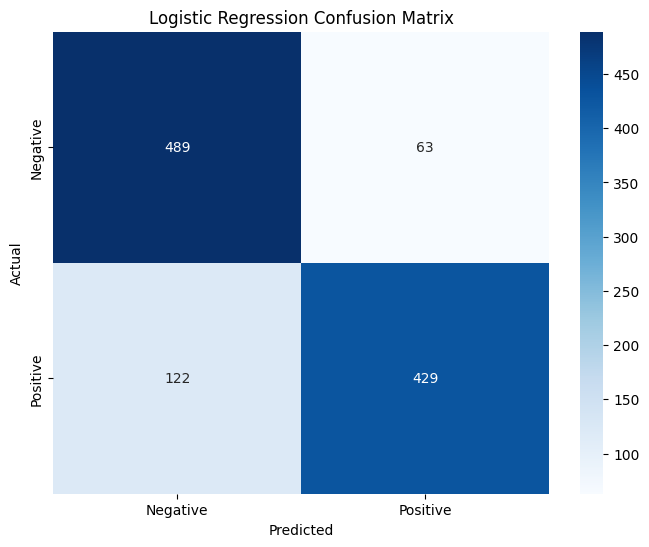

In [32]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
cm = confusion_matrix(y_test, logistic_reg.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Logistic Regression Confusion Matrix')
plt.show()

In [33]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return logistic_reg.predict_proba(vectors)

In [34]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)

# DT

In [35]:
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [36]:
train_accuracy_dt = accuracy_score(y_train, decision_tree.predict(X_train))
val_accuracy_dt = accuracy_score(y_val, decision_tree.predict(X_val))
test_accuracy_dt = accuracy_score(y_test, decision_tree.predict(X_test))
print("Decision Tree Training Accuracy:", train_accuracy_dt)
print("Decision Tree Validation Accuracy:", val_accuracy_dt)
print("Decision Tree Test Accuracy:", test_accuracy_dt)

Decision Tree Training Accuracy: 0.9968889753062415
Decision Tree Validation Accuracy: 0.8121597096188747
Decision Tree Test Accuracy: 0.8268359020852222


In [37]:
print("Decision Tree Classification Report:")
print(classification_report(y_test, decision_tree.predict(X_test)))

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.81      0.86      0.83       552
         1.0       0.85      0.79      0.82       551

    accuracy                           0.83      1103
   macro avg       0.83      0.83      0.83      1103
weighted avg       0.83      0.83      0.83      1103



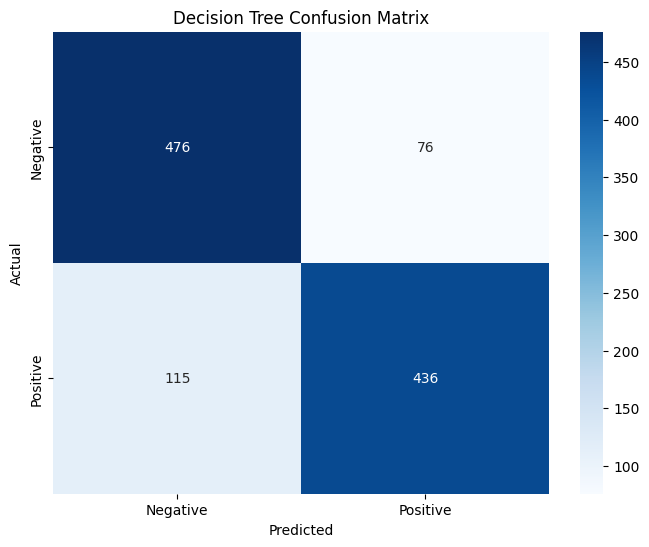

In [38]:
cm_dt = confusion_matrix(y_test, decision_tree.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_dt, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Decision Tree Confusion Matrix')
plt.show()

In [39]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return decision_tree.predict_proba(vectors)

In [40]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)

# RF

In [41]:
random_forest = RandomForestClassifier()
random_forest.fit(X_train, y_train)
train_accuracy_rf = accuracy_score(y_train, random_forest.predict(X_train))
val_accuracy_rf = accuracy_score(y_val, random_forest.predict(X_val))
test_accuracy_rf = accuracy_score(y_test, random_forest.predict(X_test))

print("Random Forest Training Accuracy:", train_accuracy_rf)
print("Random Forest Validation Accuracy:", val_accuracy_rf)
print("Random Forest Test Accuracy:", test_accuracy_rf)

Random Forest Training Accuracy: 0.9968889753062415
Random Forest Validation Accuracy: 0.8611615245009074
Random Forest Test Accuracy: 0.85675430643699


In [42]:
print("Random Forest Classification Report:")
print(classification_report(y_test, random_forest.predict(X_test)))

Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.88      0.86       552
         1.0       0.88      0.83      0.85       551

    accuracy                           0.86      1103
   macro avg       0.86      0.86      0.86      1103
weighted avg       0.86      0.86      0.86      1103



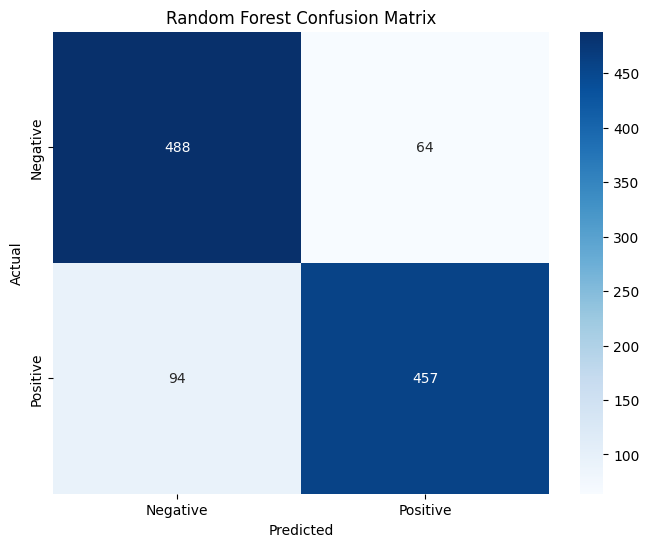

In [43]:
cm_rf = confusion_matrix(y_test, random_forest.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest Confusion Matrix')
plt.show()

In [44]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return random_forest.predict_proba(vectors)

In [45]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)

# Naive Bayes

In [46]:
from sklearn.preprocessing import MinMaxScaler

# Scale the features to the range [0, 1]
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [47]:
naive_bayes = MultinomialNB()
naive_bayes.fit(X_train_scaled, y_train)
train_accuracy_nb = accuracy_score(y_train, naive_bayes.predict(X_train))
val_accuracy_nb = accuracy_score(y_val, naive_bayes.predict(X_val))
test_accuracy_nb = accuracy_score(y_test, naive_bayes.predict(X_test))

print("Naive Bayes Training Accuracy:", train_accuracy_nb)
print("Naive Bayes Validation Accuracy:", val_accuracy_nb)
print("Naive Bayes Test Accuracy:", test_accuracy_nb)

Naive Bayes Training Accuracy: 0.5222632704647093
Naive Bayes Validation Accuracy: 0.5090744101633394
Naive Bayes Test Accuracy: 0.5240253853127833


In [48]:
print("Naive Bayes Classification Report:")
print(classification_report(y_test, naive_bayes.predict(X_test)))

Naive Bayes Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.05      0.10       552
         1.0       0.51      0.99      0.68       551

    accuracy                           0.52      1103
   macro avg       0.71      0.52      0.39      1103
weighted avg       0.71      0.52      0.39      1103



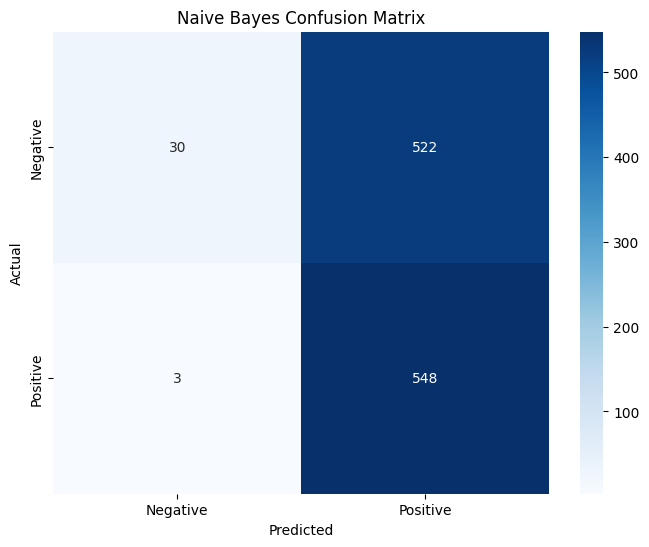

In [49]:
cm_nb = confusion_matrix(y_test, naive_bayes.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_nb, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Naive Bayes Confusion Matrix')
plt.show()

In [50]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return naive_bayes.predict_proba(vectors)

In [51]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)

# KNN

In [52]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
train_accuracy_knn = accuracy_score(y_train, knn.predict(X_train))
val_accuracy_knn = accuracy_score(y_val, knn.predict(X_val))
test_accuracy_knn = accuracy_score(y_test, knn.predict(X_test))

print("KNN Training Accuracy:", train_accuracy_knn)
print("KNN Validation Accuracy:", val_accuracy_knn)
print("KNN Test Accuracy:", test_accuracy_knn)

KNN Training Accuracy: 0.7316741201633288
KNN Validation Accuracy: 0.6887477313974592
KNN Test Accuracy: 0.6618313689936537


In [53]:
print("KNN Classification Report:")
print(classification_report(y_test, knn.predict(X_test)))

KNN Classification Report:
              precision    recall  f1-score   support

         0.0       0.60      0.95      0.74       552
         1.0       0.88      0.37      0.52       551

    accuracy                           0.66      1103
   macro avg       0.74      0.66      0.63      1103
weighted avg       0.74      0.66      0.63      1103



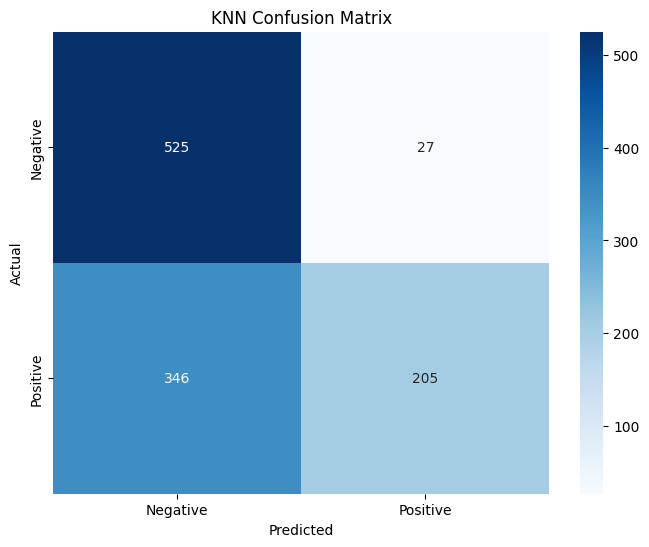

In [54]:
cm_knn = confusion_matrix(y_test, knn.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_knn, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('KNN Confusion Matrix')
plt.show()

In [55]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return knn.predict_proba(vectors)

In [56]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)

# SVM

In [57]:
svm_classifier = SVC(probability=True)
svm_classifier.fit(X_train, y_train)
train_accuracy_svm = accuracy_score(y_train, svm_classifier.predict(X_train))
val_accuracy_svm = accuracy_score(y_val, svm_classifier.predict(X_val))
test_accuracy_svm = accuracy_score(y_test, svm_classifier.predict(X_test))

print("SVM Training Accuracy:", train_accuracy_svm)
print("SVM Validation Accuracy:", val_accuracy_svm)
print("SVM Test Accuracy:", test_accuracy_svm)

SVM Training Accuracy: 0.8961695508458098
SVM Validation Accuracy: 0.8765880217785844
SVM Test Accuracy: 0.8676337262012692


In [58]:
print("SVM Classification Report:")
print(classification_report(y_test, svm_classifier.predict(X_test)))

SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87       552
         1.0       0.87      0.86      0.87       551

    accuracy                           0.87      1103
   macro avg       0.87      0.87      0.87      1103
weighted avg       0.87      0.87      0.87      1103



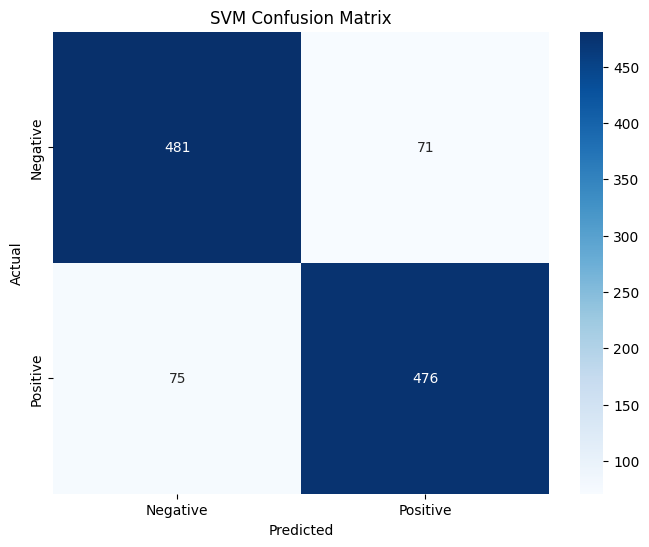

In [59]:
cm_svm = confusion_matrix(y_test, svm_classifier.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('SVM Confusion Matrix')
plt.show()

In [60]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return svm_classifier.predict_proba(vectors)

In [61]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)

# SGD

In [62]:
sgd_classifier = SGDClassifier(loss='log')
sgd_classifier.fit(X_train, y_train)

train_accuracy_sgd = accuracy_score(y_train, sgd_classifier.predict(X_train))
val_accuracy_sgd = accuracy_score(y_val, sgd_classifier.predict(X_val))
test_accuracy_sgd = accuracy_score(y_test, sgd_classifier.predict(X_test))

print("SGD Training Accuracy:", train_accuracy_sgd)
print("SGD Validation Accuracy:", val_accuracy_sgd)
print("SGD Test Accuracy:", test_accuracy_sgd)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(


SGD Training Accuracy: 0.8716702313824616
SGD Validation Accuracy: 0.8348457350272233
SGD Test Accuracy: 0.8331822302810517


In [63]:
print("SGD Classification Report:")
print(classification_report(y_test, sgd_classifier.predict(X_test)))

SGD Classification Report:
              precision    recall  f1-score   support

         0.0       0.81      0.88      0.84       552
         1.0       0.87      0.79      0.83       551

    accuracy                           0.83      1103
   macro avg       0.84      0.83      0.83      1103
weighted avg       0.84      0.83      0.83      1103



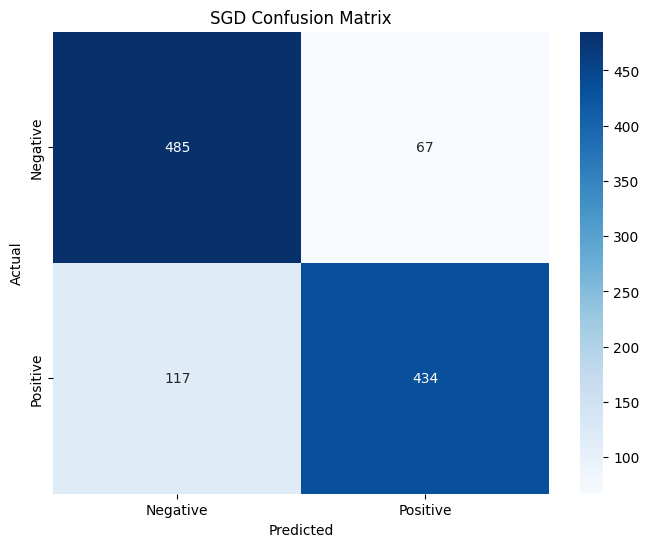

In [64]:
cm_sgd = confusion_matrix(y_test, sgd_classifier.predict(X_test))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_sgd, annot=True, cmap='Blues', fmt='g', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('SGD Confusion Matrix')
plt.show()

In [65]:
def predict_proba(texts):
    vectors = vectorizer.transform(texts)
    return sgd_classifier.predict_proba(vectors)

In [66]:
# Example text to explain
text_to_explain = "সত্যি শাড়িটা অসাধারণ।  দামের তুলনায় অনেক ভালো একটা শাড়ি। সবাই নিতে পারেন। আমার অনেক পছন্দ হয়েছে।  ডেলিভারিও খুব তাড়াতাড়ি পেয়ে গেছি"
explanation = explainer.explain_instance(text_to_explain, predict_proba, num_features=10)

# Display the explanation
explanation.show_in_notebook(text=text_to_explain)